## Generating Synthetic data for a heathcare dataset "diabetes" with the models TabDDPM and TabSyn

In [3]:
import os
current_dir=os.getcwd()
# adding the path to teh cloned repository
current_dir = os.path.join(current_dir, 'tabsyn')

In [1]:
%cd C:\Users\neetu\Documents\Untitled_Folder\tabsyn

C:\Users\neetu\Documents\Untitled_Folder\tabsyn


C:\Users\neetu\anaconda3\envs\tab\lib\site-packages\IPython\core\magics\osm.py:417: UserWarning: using dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [2]:
!pip install dgl

DEPRECATION: xgbse 0.2.3 has a non-standard dependency specifier pandas>=1.0.*. pip 24.0 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of xgbse or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063


In [3]:
!pip install peft

DEPRECATION: xgbse 0.2.3 has a non-standard dependency specifier pandas>=1.0.*. pip 24.0 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of xgbse or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063


In [4]:
!pip install datasets

DEPRECATION: xgbse 0.2.3 has a non-standard dependency specifier pandas>=1.0.*. pip 24.0 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of xgbse or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063


In [5]:
!pip install torch_geometric

DEPRECATION: xgbse 0.2.3 has a non-standard dependency specifier pandas>=1.0.*. pip 24.0 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of xgbse or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063


In [6]:
# install other dependencies
!pip install -r requirements.txt

DEPRECATION: xgbse 0.2.3 has a non-standard dependency specifier pandas>=1.0.*. pip 24.0 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of xgbse or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063


## Using my own dataset

#### Making a directory called "diabetes" in the data folder to keep the csv file of diabetes

In [7]:
# Create a directory for the dataset
#%cd $current_dir/data
%mkdir data\diabetes

A subdirectory or file data\diabetes already exists.


#### The dataset has been installed from the UCI Repository with link "https://archive.ics.uci.edu/dataset/891/cdc+diabetes+health+indicators"

In [10]:
!pip install ucimlrepo

DEPRECATION: xgbse 0.2.3 has a non-standard dependency specifier pandas>=1.0.*. pip 24.0 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of xgbse or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063


##### Fetching the dataset from the website.

In [11]:
from ucimlrepo import fetch_ucirepo 
  
# fetch dataset 
diabetes = fetch_ucirepo(id=891) 
  
# data (as pandas dataframes) 
X = diabetes.data.features 
y = diabetes.data.targets 
  
# metadata 
print(diabetes.metadata) 
  
# variable information 
print(diabetes.variables)

{'uci_id': 891, 'name': 'CDC Diabetes Health Indicators', 'repository_url': 'https://archive.ics.uci.edu/dataset/891/cdc+diabetes+health+indicators', 'data_url': 'https://archive.ics.uci.edu/static/public/891/data.csv', 'abstract': 'The Diabetes Health Indicators Dataset contains healthcare statistics and lifestyle survey information about people in general along with their diagnosis of diabetes. The 35 features consist of some demographics, lab test results, and answers to survey questions for each patient. The target variable for classification is whether a patient has diabetes, is pre-diabetic, or healthy. ', 'area': 'Health and Medicine', 'tasks': ['Classification'], 'characteristics': ['Tabular', 'Multivariate'], 'num_instances': 253680, 'num_features': 21, 'feature_types': ['Categorical', 'Integer'], 'demographics': ['Sex', 'Age', 'Education Level', 'Income'], 'target_col': ['Diabetes_binary'], 'index_col': ['ID'], 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_

In [16]:
diabetes.data.features

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,1,1,1,40,1,0,0,0,0,1,...,1,0,5,18,15,1,0,9,4,3
1,0,0,0,25,1,0,0,1,0,0,...,0,1,3,0,0,0,0,7,6,1
2,1,1,1,28,0,0,0,0,1,0,...,1,1,5,30,30,1,0,9,4,8
3,1,0,1,27,0,0,0,1,1,1,...,1,0,2,0,0,0,0,11,3,6
4,1,1,1,24,0,0,0,1,1,1,...,1,0,2,3,0,0,0,11,5,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253675,1,1,1,45,0,0,0,0,1,1,...,1,0,3,0,5,0,1,5,6,7
253676,1,1,1,18,0,0,0,0,0,0,...,1,0,4,0,0,1,0,11,2,4
253677,0,0,1,28,0,0,0,1,1,0,...,1,0,1,0,0,0,0,2,5,2
253678,1,0,1,23,0,0,0,0,1,1,...,1,0,3,0,0,0,1,7,5,1


#### Joined the dataset with target varaibles and then transforemd the joined dataset into "pandas dataframe" for further analysis.

In [14]:
import pandas as pd
diabetes = pd.concat([diabetes.data.features,diabetes.data.targets],axis=1)

In [15]:
diabetes

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income,Diabetes_binary
0,1,1,1,40,1,0,0,0,0,1,...,0,5,18,15,1,0,9,4,3,0
1,0,0,0,25,1,0,0,1,0,0,...,1,3,0,0,0,0,7,6,1,0
2,1,1,1,28,0,0,0,0,1,0,...,1,5,30,30,1,0,9,4,8,0
3,1,0,1,27,0,0,0,1,1,1,...,0,2,0,0,0,0,11,3,6,0
4,1,1,1,24,0,0,0,1,1,1,...,0,2,3,0,0,0,11,5,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253675,1,1,1,45,0,0,0,0,1,1,...,0,3,0,5,0,1,5,6,7,0
253676,1,1,1,18,0,0,0,0,0,0,...,0,4,0,0,1,0,11,2,4,1
253677,0,0,1,28,0,0,0,1,1,0,...,0,1,0,0,0,0,2,5,2,0
253678,1,0,1,23,0,0,0,0,1,1,...,0,3,0,0,0,1,7,5,1,0


**Interpretation** : This is the final dataset that we would be using in our project.

In [27]:
diabetes.columns

Index(['HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker', 'Stroke',
       'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
       'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Education', 'Income',
       'Diabetes_binary'],
      dtype='object')

##### Saved the pandas dataframe (diabetes) in the csv format in the diabetes repo created earlier in data file.

In [28]:
import pandas as pd

# Assuming you have a DataFrame named 'diabetes'

# Save DataFrame to CSV file
diabetes.to_csv(r'C:\Users\neetu\Documents\Untitled_Folder\tabsyn\data\diabetes\diabetes.csv',index=False)


##### write a .json file (obesity.json) recording the metadata of the tabular, covering the following information.

In [23]:
import json

metadata = {
    "name": "diabetes",
    "task_type": "binclass",  # binclass or regression or multiclass
    "header": "infer",
    "column_names": None,
    "num_col_idx": [0,5,15,16,17,20,21,22],  # list of indices of numerical columns
    "cat_col_idx": [2,3,4,6,7,8,9,10,11,12,13,14,18,19],  # list of indices of categorical columns
    "target_col_idx": [1],  # list of indices of the target columns (for MLE)
    "file_type": "csv",
    "data_path": f"data/diabetes/obesity.csv",
    "test_path": None,
}

##### Saved the .json file in data\Info\diabetes.json directory.

In [27]:
# Save the metadata as a JSON file
with open("C:\\Users\\neetu\\Documents\\Untitled_Folder\\tabsyn\\data\\Info\\diabetes.json", "w") as json_file:
    json.dump(metadata, json_file, indent=4)

In [16]:
import json

In [24]:
with open("data/Info/diabetes.json", 'r') as json_file:
    data = json.load(json_file)

In [25]:
# Modify the data as needed
data['num_col_idx'] = [3,13,14,15,18,19,20]  # list of indices of numerical columns
data['cat_col_idx']= [0,1,2,4,5,6,7,8,9,10,11,12,16,17]  # list of indices of categorical columns
data['target_col_idx']=[21]  # list of indices of the target columns (for MLE)

# Write the updated data back to the JSON file
with open("data/Info/diabetes.json", 'w') as json_file:
    json.dump(data, json_file, indent=4)

In [22]:
!python download_dataset.py

Start processing dataset obesity from UCI.
Aready downloaded.


##### Preprocessed the dataset and split it into train and test dataset as well.

In [29]:
! python process_dataset.py

adult (32561, 15) (16281, 15) (32561, 15)
Numerical (32561, 6)
Categorical (32561, 8)
Processing and Saving adult Successfully!
adult
Total 48842
Train 32561
Test 16281
Num 6
Cat 9
default (27000, 24) (3000, 24) (30000, 24)
Numerical (27000, 14)
Categorical (27000, 9)
Processing and Saving default Successfully!
default
Total 30000
Train 27000
Test 3000
Num 14
Cat 10
shoppers (11097, 18) (1233, 18) (12330, 18)
Numerical (11097, 10)
Categorical (11097, 7)
Processing and Saving shoppers Successfully!
shoppers
Total 12330
Train 11097
Test 1233
Num 10
Cat 8
magic (17117, 11) (1902, 11) (19019, 11)
Numerical (17117, 10)
Categorical (17117, 0)
Processing and Saving magic Successfully!
magic
Total 19019
Train 17117
Test 1902
Num 10
Cat 1
beijing (37581, 12) (4176, 12) (41757, 12)
Numerical (37581, 6)
Categorical (37581, 5)
Processing and Saving beijing Successfully!
beijing
Total 41757
Train 37581
Test 4176
Num 7
Cat 5
news (35679, 48) (3965, 48) (39644, 48)
Numerical (35679, 45)
Categorical (

##### Creating the .toml file in config directory for diabetes dataset

In [30]:
%%writefile C:/Users/neetu/Documents/Untitled_Folder/tabsyn/baselines/tabddpm/configs/diabetes.toml
# Sample TOML file for diabetes configuration

parent_dir = "configs/diabetes"
model_save_path = "ckpt/diabetes"
sample_save_path = "sampled/diabetes"
real_data_path = "Data/diabetes"

num_numerical_features = 8
model_type = "mlp"
task_type = "binclass"  #changed from "multiclass" to "binclass"

[model_params]
num_classes = 7
is_y_cond = false

[model_params.rtdl_params]
d_layers = [
    1024,
    2048,
    2048,
    1024,
]
dropout = 0.0

[diffusion_params]
num_timesteps = 1000
gaussian_loss_type = "mse"

[train.main]
steps = 1000 #changed from 100000 to 100 for understanding
lr = 0.001809824563637657
weight_decay = 5e-4
batch_size = 4096

[train.T]
seed = 0
normalization = "quantile"
num_nan_policy = "mean"
cat_nan_policy = "__none__"
cat_min_frequency = "__none__"
cat_encoding = "__none__"
y_policy = "default"

[sample]
num_samples = 228312
batch_size = 1000
seed = 0

[eval.type]
eval_model = "mlp"
eval_type = "synthetic"

[eval.T]
seed = 0
normalization = "quantile"
num_nan_policy = "__none__"
cat_nan_policy = "__none__"
cat_min_frequency = "__none__"
cat_encoding = "one-hot"
y_policy = "default"

Writing C:/Users/neetu/Documents/Untitled_Folder/tabsyn/baselines/tabddpm/configs/diabetes.toml


## Training the Models

#### Trained the Tabddpm Model with diabetes dataset with 1000 epochs

In [16]:
# train Tabddpm model for "diabetes" dataset
!python main.py --dataname diabetes --method tabddpm --mode train

START TRAINING
No NaNs in numerical features, skipping
37
{'num_classes': 7, 'is_y_cond': False, 'rtdl_params': {'d_layers': [1024, 2048, 2048, 1024], 'dropout': 0.0}, 'd_in': 37}
mlp
MLPDiffusion(
  (mlp): MLP(
    (blocks): ModuleList(
      (0): Block(
        (linear): Linear(in_features=1024, out_features=1024, bias=True)
        (activation): ReLU()
        (dropout): Dropout(p=0.0, inplace=False)
      )
      (1): Block(
        (linear): Linear(in_features=1024, out_features=2048, bias=True)
        (activation): ReLU()
        (dropout): Dropout(p=0.0, inplace=False)
      )
      (2): Block(
        (linear): Linear(in_features=2048, out_features=2048, bias=True)
        (activation): ReLU()
        (dropout): Dropout(p=0.0, inplace=False)
      )
      (3): Block(
        (linear): Linear(in_features=2048, out_features=1024, bias=True)
        (activation): ReLU()
        (dropout): Dropout(p=0.0, inplace=False)
      )
    )
    (head): Linear(in_features=1024, out_feature

**Results**: 
- Trained the TabDDPM by the diabetes dataset with 1000 epochs.
- It took less than an hour to get it trained.

#### Trained the VAE Model with diabetes dataset with 1000 epochs

In [32]:
# train VAE first
!python main.py --dataname diabetes --method vae --mode train

No NaNs in numerical features, skipping
self.category_embeddings.weight.shape=torch.Size([30, 4])
self.category_embeddings.weight.shape=torch.Size([30, 4])
epoch: 0, beta = 0.010000, Train MSE: 3.270845, Train CE:0.611654, Train KL:1.345436, Val MSE:1.233094, Val CE:0.455410, Train ACC:0.814248, Val ACC:0.819145
epoch: 1, beta = 0.010000, Train MSE: 0.557952, Train CE:0.318233, Train KL:3.369363, Val MSE:0.131489, Val CE:0.185007, Train ACC:0.946680, Val ACC:0.946113
epoch: 2, beta = 0.010000, Train MSE: 0.068997, Train CE:0.115310, Train KL:4.783970, Val MSE:0.040102, Val CE:0.069605, Train ACC:0.987951, Val ACC:0.987651
epoch: 3, beta = 0.010000, Train MSE: 0.032565, Train CE:0.045089, Train KL:4.926956, Val MSE:0.027255, Val CE:0.026081, Train ACC:0.998417, Val ACC:0.998547
epoch: 4, beta = 0.010000, Train MSE: 0.024014, Train CE:0.017397, Train KL:4.788069, Val MSE:0.020927, Val CE:0.011557, Train ACC:0.999934, Val ACC:0.999966
epoch: 5, beta = 0.010000, Train MSE: 0.019050, Train 


Epoch 1/1000: 100%|##########| 56/56 [00:15<00:00,  3.57it/s]

Epoch 2/1000: 100%|##########| 56/56 [00:14<00:00,  3.80it/s]

Epoch 3/1000: 100%|##########| 56/56 [00:14<00:00,  3.86it/s]

Epoch 4/1000: 100%|##########| 56/56 [00:14<00:00,  3.76it/s]

Epoch 5/1000: 100%|##########| 56/56 [00:14<00:00,  3.80it/s]

Epoch 6/1000: 100%|##########| 56/56 [00:14<00:00,  3.86it/s]

Epoch 7/1000: 100%|##########| 56/56 [00:14<00:00,  3.90it/s]

Epoch 8/1000: 100%|##########| 56/56 [00:14<00:00,  3.89it/s]

Epoch 9/1000: 100%|##########| 56/56 [00:14<00:00,  3.95it/s]

Epoch 10/1000: 100%|##########| 56/56 [00:14<00:00,  3.85it/s]

Epoch 11/1000: 100%|##########| 56/56 [00:14<00:00,  3.80it/s]

Epoch 12/1000: 100%|##########| 56/56 [00:14<00:00,  3.83it/s]

Epoch 13/1000: 100%|##########| 56/56 [00:14<00:00,  3.92it/s]

Epoch 14/1000: 100%|##########| 56/56 [00:14<00:00,  3.79it/s]

Epoch 15/1000: 100%|##########| 56/56 [00:14<00:00,  3.78it/s]

Epoch 16/1000: 100%|##########| 56/56 [00:14<00:

**Results**:
- Trained the VAE model by diabetes dataset with 1000 epochs
- It took around 5 hrs to get it trained.

#### Trained the Tabsyn Model with diabetes dataset with 1001 epochs

In [35]:
# after the VAE is trained, train the diffusion model
!python main.py --dataname obesity --method tabsyn --mode train

C:\Users\neetu\Documents\Untitled_Folder\tabsyn\tabsyn/ckpt/obesity/
MLPDiffusion(
  (proj): Linear(in_features=68, out_features=1024, bias=True)
  (mlp): Sequential(
    (0): Linear(in_features=1024, out_features=2048, bias=True)
    (1): SiLU()
    (2): Linear(in_features=2048, out_features=2048, bias=True)
    (3): SiLU()
    (4): Linear(in_features=2048, out_features=1024, bias=True)
    (5): SiLU()
    (6): Linear(in_features=1024, out_features=68, bias=True)
  )
  (map_noise): PositionalEmbedding()
  (time_embed): Sequential(
    (0): Linear(in_features=1024, out_features=1024, bias=True)
    (1): SiLU()
    (2): Linear(in_features=1024, out_features=1024, bias=True)
  )
)
the number of parameters 10633284
Time:  6164.36398267746



Epoch 1/1001: 100%|##########| 1/1 [00:08<00:00,  8.15s/it, Loss=1.04]

Epoch 2/1001: 100%|##########| 1/1 [00:06<00:00,  6.07s/it, Loss=0.996]

Epoch 3/1001: 100%|##########| 1/1 [00:06<00:00,  6.12s/it, Loss=0.992]

Epoch 4/1001: 100%|##########| 1/1 [00:06<00:00,  6.09s/it, Loss=0.969]

Epoch 5/1001: 100%|##########| 1/1 [00:06<00:00,  6.03s/it, Loss=0.965]

Epoch 6/1001: 100%|##########| 1/1 [00:06<00:00,  6.19s/it, Loss=0.959]

Epoch 7/1001: 100%|##########| 1/1 [00:06<00:00,  6.06s/it, Loss=0.954]

Epoch 8/1001: 100%|##########| 1/1 [00:06<00:00,  6.22s/it, Loss=0.93]

Epoch 9/1001: 100%|##########| 1/1 [00:06<00:00,  6.29s/it, Loss=0.924]

Epoch 10/1001: 100%|##########| 1/1 [00:06<00:00,  6.11s/it, Loss=0.917]

Epoch 11/1001: 100%|##########| 1/1 [00:06<00:00,  6.40s/it, Loss=0.901]

Epoch 12/1001: 100%|##########| 1/1 [00:06<00:00,  6.38s/it, Loss=0.892]

Epoch 13/1001: 100%|##########| 1/1 [00:06<00:00,  6.11s/it, Loss=0.878]

Epoch 14/1001: 100%|##########| 1/1 [00:06<00:00

**Results** : 
- Trained the Diffusion Model with diabetes dataset with 1001 epochs.
- It took approx. 3 hrs to get it trained.

## Generating the synthetic data with both the Trained Models

In [24]:
#Generating the synthetic data by trained tabddpm model and saving it to synthetic/diabetes/tabppm.csv
!python main.py --dataname diabetes --method tabddpm --mode sample --save_path C:\Users\neetu\Documents\Untitled_Folder\tabsyn\synthetic\diabetes\tabddpm.csv

START SAMPLING
No NaNs in numerical features, skipping
mlp
torch.Size([1000, 30])
Sample timestep  999
Sample timestep  998
Sample timestep  997
Sample timestep  996
Sample timestep  995
Sample timestep  994
Sample timestep  993
Sample timestep  992
Sample timestep  991
Sample timestep  990
Sample timestep  989
Sample timestep  988
Sample timestep  987
Sample timestep  986
Sample timestep  985
Sample timestep  984
Sample timestep  983
Sample timestep  982
Sample timestep  981
Sample timestep  980
Sample timestep  979
Sample timestep  978
Sample timestep  977
Sample timestep  976
Sample timestep  975
Sample timestep  974
Sample timestep  973
Sample timestep  972
Sample timestep  971
Sample timestep  970
Sample timestep  969
Sample timestep  968
Sample timestep  967
Sample timestep  966
Sample timestep  965
Sample timestep  964
Sample timestep  963
Sample timestep  962
Sample timestep  961
Sample timestep  960
Sample timestep  959
Sample timestep  958
Sample timestep  957
Sample timestep

**Results**:
- Generated the synthetic data from the trained TabDDPM model and stored it in the required directory.
- It took around 1.9 hour in order to generate the dataset.

In [46]:
%config Application.iopub_data_rate_limit=2000000

In [30]:
# Generating synthetic data by trained tabsyn model and saving it to synthetic/diabetes/tabsyn.csv
!python main.py --dataname diabetes --method tabsyn --mode sample --save_path C:\Users\neetu\Documents\Untitled_Folder\tabsyn\synthetic\diabetes\tabsyn.csv

^C


**Results**: 
- Generated teh syntehtic data from the trained TabSyn model and stored in the required directory.
- It took around 1 hour in order to generate the synthetic data.

In [29]:
import os
os.getcwd()

'C:\\Users\\neetu\\Documents\\Untitled_Folder\\tabsyn'

## Evaluation

### Stastical Evaluation

In [2]:
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
# Read the real and synthetic datasets 
real_diabetes = pd.read_csv(r'C:\Users\neetu\Documents\Untitled_Folder\tabsyn\data\diabetes\train.csv')
syn_diabetes_tabddpm = pd.read_csv(r'C:\Users\neetu\Documents\Untitled_Folder\tabsyn\synthetic\diabetes\tabddpm.csv')
syn_diabetes_tabsyn = pd.read_csv(r'C:\Users\neetu\Documents\Untitled_Folder\tabsyn\synthetic\diabetes\tabsyn.csv')

In [4]:
real_diabetes.head()

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income,Diabetes_binary
0,1,0,1,40.0,1,0,1,1,1,1,...,0,4.0,0.0,0.0,0,1,11.0,4.0,5.0,0
1,1,1,1,25.0,0,0,0,0,0,1,...,0,4.0,30.0,14.0,1,0,9.0,4.0,6.0,0
2,0,0,1,30.0,1,0,0,1,1,1,...,0,1.0,0.0,0.0,0,0,10.0,6.0,8.0,0
3,0,1,1,22.0,0,0,0,1,1,1,...,0,3.0,15.0,3.0,0,0,8.0,5.0,8.0,0
4,0,0,1,24.0,0,0,0,1,1,1,...,0,3.0,0.0,5.0,0,0,6.0,6.0,8.0,1


In [5]:
syn_diabetes_tabddpm.head()

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income,Diabetes_binary
0,0,0,1,98.0,0,0,0,1,0,1,...,0,5.0,0.0,30.0,0,0,1.0,6.0,1.0,0
1,0,0,1,12.0,0,0,0,1,1,1,...,0,1.0,30.0,30.0,0,0,13.0,1.0,8.0,0
2,0,0,1,98.0,1,0,0,1,0,1,...,0,1.0,0.0,30.0,0,0,13.0,1.0,8.0,0
3,0,0,1,98.0,1,0,0,1,1,1,...,0,5.0,0.0,30.0,0,0,1.0,6.0,1.0,0
4,0,0,1,98.0,0,0,0,1,0,1,...,0,5.0,30.0,30.0,0,0,1.0,1.0,8.0,0


In [6]:
syn_diabetes_tabsyn.head()

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income,Diabetes_binary
0,1,0,1,30.000000,1,0,0,1,0,1,...,1,3.0,0.0,0.0,0,1,12.0,4.0,4.0,1
1,1,1,1,29.000000,0,0,0,1,0,0,...,0,1.0,0.0,0.0,0,1,11.0,4.0,8.0,0
2,0,0,1,32.000000,1,0,0,1,1,1,...,0,2.0,5.0,0.0,0,1,4.0,5.0,8.0,0
3,0,1,1,32.000000,1,0,1,0,1,1,...,0,4.0,0.0,0.0,0,1,13.0,6.0,5.0,0
4,0,0,1,45.848675,1,0,0,0,0,1,...,0,5.0,15.0,14.0,0,1,9.0,5.0,8.0,0


#### Descriptive Statstics

In [7]:
# Comparing the mean of each feature of three datasets
real_diabetes_stats = real_diabetes.describe().loc[['mean']].transpose()
syn_diabetes_tabddpm_stats = syn_diabetes_tabddpm.describe().loc[['mean']].transpose()
syn_diabetes_tabsyn_stats = syn_diabetes_tabsyn.describe().loc[['mean']].transpose()

In [8]:
# Concatenate the statistics for comparison
stats_comparison = pd.concat([real_diabetes_stats, syn_diabetes_tabddpm_stats, syn_diabetes_tabsyn_stats], axis=1)
stats_comparison.columns = ['Real_mean', 'Synthetic_Tabddpm_mean','Syntehtic_Tabsyn_mean']
print(stats_comparison)

                      Real_mean  Synthetic_Tabddpm_mean  Syntehtic_Tabsyn_mean
HighBP                 0.428852                0.045390               0.455859
HighChol               0.424481                0.029793               0.404153
CholCheck              0.962871                1.000000               0.964776
BMI                   28.381570               62.187751              28.646031
Smoker                 0.443349                0.334866               0.428304
Stroke                 0.040309                0.000000               0.040813
HeartDiseaseorAttack   0.094095                0.000175               0.091173
PhysActivity           0.756623                0.961062               0.750324
Fruits                 0.634662                0.195211               0.658559
Veggies                0.811762                0.981928               0.815314
HvyAlcoholConsump      0.056383                0.000000               0.053637
AnyHealthcare          0.951036                0.998

In [44]:
# Comparing the mean of each feature of three datasets
real_diabetes_stats = real_diabetes[diabetes_num].describe().loc[['mean']].transpose()
syn_diabetes_tabddpm_stats = syn_diabetes_tabddpm[diabetes_num].describe().loc[['mean']].transpose()
syn_diabetes_tabsyn_stats = syn_diabetes_tabsyn[diabetes_num].describe().loc[['mean']].transpose()

In [45]:
# Concatenate the statistics for comparison
stats_comparison = pd.concat([real_diabetes_stats, syn_diabetes_tabddpm_stats, syn_diabetes_tabsyn_stats], axis=1)
stats_comparison.columns = ['Real_mean', 'Synthetic_Tabddpm_mean','Syntehtic_Tabsyn_mean']
print(stats_comparison)

          Real_mean  Synthetic_Tabddpm_mean  Syntehtic_Tabsyn_mean
BMI       28.381570               62.187751              28.668962
MentHlth   3.186933               14.872102               2.910215
PhysHlth   4.244021               15.408222               3.946255


In [46]:
# Comparing the std of each feature of three datasets
real_diabetes_stats = real_diabetes[diabetes_num].describe().loc[['std']].transpose()
syn_diabetes_tabddpm_stats = syn_diabetes_tabddpm[diabetes_num].describe().loc[['std']].transpose()
syn_diabetes_tabsyn_stats = syn_diabetes_tabsyn[diabetes_num].describe().loc[['std']].transpose()

In [47]:
# Concatenate the statistics for comparison
stats_comparison = pd.concat([real_diabetes_stats, syn_diabetes_tabddpm_stats, syn_diabetes_tabsyn_stats], axis=1)
stats_comparison.columns = ['Real_std', 'Synthetic_Tabddpm_std','Syntehtic_Tabsyn_std']
print(stats_comparison)

          Real_std  Synthetic_Tabddpm_std  Syntehtic_Tabsyn_std
BMI       6.609626              42.388578              6.761062
MentHlth  7.415807              14.999379              7.102585
PhysHlth  8.723033              14.994396              8.460936


In [ ]:
**Results**:
- 

In [9]:
# Comparing the std of each feature of three datasets
real_diabetes_stats = real_diabetes.describe().loc[['std']].transpose()
syn_diabetes_tabddpm_stats = syn_diabetes_tabddpm.describe().loc[['std']].transpose()
syn_diabetes_tabsyn_stats = syn_diabetes_tabsyn.describe().loc[['std']].transpose()

In [10]:
# Concatenate the statistics for comparison
stats_comparison = pd.concat([real_diabetes_stats, syn_diabetes_tabddpm_stats, syn_diabetes_tabsyn_stats], axis=1)
stats_comparison.columns = ['Real_std', 'Synthetic_Tabddpm_std','Syntehtic_Tabsyn_std']
print(stats_comparison)

                      Real_std  Synthetic_Tabddpm_std  Syntehtic_Tabsyn_std
HighBP                0.494913               0.208158              0.498049
HighChol              0.494265               0.170015              0.490728
CholCheck             0.189078               0.000000              0.184345
BMI                   6.609626              42.388578              6.705848
Smoker                0.496781               0.471945              0.494834
Stroke                0.196683               0.000000              0.197856
HeartDiseaseorAttack  0.291961               0.013235              0.287856
PhysActivity          0.429122               0.193448              0.432826
Fruits                0.481526               0.396364              0.474194
Veggies               0.390903               0.133211              0.388043
HvyAlcoholConsump     0.230661               0.000000              0.225301
AnyHealthcare         0.215793               0.042749              0.220294
NoDocbcCost 

##### ANOVA Test:
- **Null Hypothesis(H0)**: There is **no difference** in the mean values of the variables between the two datasets.
- **Alternative Hypothesis(H1)**: There is a **difference** in the mean values of the variables between the two datasets.
- If p-value < significance value, **reject** H0 and conclude that there are significant differences between the mean values.
- If p-value > significance value, **do not reject** the H0 and conclude that there is no difference between the mean values.

In [39]:
from scipy.stats import f_oneway
# Perform one-way ANOVA
f_statistic, p_value = f_oneway(real_diabetes[diabetes_num], syn_diabetes_tabddpm[diabetes_num])
print("f_statistics: ",f_statistic)
print("p_value: ",p_value)

f_statistics:  [141771.89886135 111347.01905134  94564.53750522]
p_value:  [0. 0. 0.]


In [41]:
from scipy.stats import f_oneway
# Perform one-way ANOVA
f_statistic, p_value = f_oneway(real_diabetes, syn_diabetes_tabddpm)
print("f_statistics: ",f_statistic)
print("p_value: ",p_value)

f_statistics:  [116459.86580394 130182.04674365   8803.84082153 141771.89886135
   5722.63010887   9589.50172289  23577.62297974  43067.75172844
 113352.86686068  38763.49667147  13642.1330539   10480.58478207
  19706.49899511  11291.42577936 111347.01905134  94564.53750522
  20923.0496932  171417.47743096   3772.84687418  78729.67836972
  46851.87971867  33849.68562563]
p_value:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [40]:
f_statistic, p_value = f_oneway(real_diabetes[diabetes_num], syn_diabetes_tabsyn[diabetes_num])
print("f_statistics: ",f_statistic)
print("p_value: ",p_value)

f_statistics:  [210.93348935 165.80341869 137.07658503]
p_value:  [8.80811810e-48 6.20042002e-38 1.17239940e-31]


In [42]:
f_statistic, p_value = f_oneway(real_diabetes, syn_diabetes_tabsyn)
print("f_statistics: ",f_statistic)
print("p_value: ",p_value)

f_statistics:  [3.46584021e+02 1.70998108e+02 5.49614357e+00 2.10933489e+02
 1.18457917e+02 2.77296946e-03 7.46477421e+00 2.34113845e+01
 2.18300344e+02 1.06824549e+01 1.56663026e+01 3.44121224e+01
 2.35249362e+01 2.47349686e+02 1.65803419e+02 1.37076585e+02
 6.13232606e+01 2.70442379e+01 1.18304767e+02 2.26746256e+01
 1.13144179e+02 6.83230011e+00]
p_value:  [2.51037995e-77 4.55203382e-39 1.90588853e-02 8.80811810e-48
 1.38722988e-27 9.58003636e-01 6.29203406e-03 1.30844698e-06
 2.18051689e-49 1.08164425e-03 7.55698579e-05 4.46242964e-09
 1.23345737e-06 1.01602385e-55 6.20042002e-38 1.17239940e-31
 4.85354923e-15 1.98937544e-07 1.49855283e-27 1.91943846e-06
 2.02077355e-26 8.95268444e-03]


**Results** : 
- For Real and TabDDPM, there are 3 varaibles with p-value less than 0.05, implies rejct H0, hence there are significant difference between the mean values.
- Whereas, for Real and TabSyn, there are only 2 variables with p-values less than 0.05.
- Doesnot provide any specific implication.

##### Comparing the percentages of each category of each "categorical variable" in real and syntehtic data

In [51]:
import pandas as pd
#cat_diabetes = real_diabetes.select_dtypes(include=['object']).columns
# Iterate through each categorical column
for column in diabetes_cat:
    # Calculate frequencies in the datasets
    freq_real_diabetes = real_diabetes[diabetes_cat].value_counts()
    freq_syn_diabetes_tabddpm = syn_diabetes_tabddpm[diabetes_cat].value_counts()
    freq_syn_diabetes_tabsyn = syn_diabetes_tabsyn[diabetes_cat].value_counts()
    
    # Calculate percentages in the datasets
    perc_real_diabetes = freq_real_diabetes / len(real_diabetes) * 100
    perc_syn_diabetes_tabddpm = freq_syn_diabetes_tabddpm / len(syn_diabetes_tabddpm) * 100
    perc_syn_diabetes_tabsyn = freq_syn_diabetes_tabsyn / len(syn_diabetes_tabsyn) * 100
    
    # Combine the percentages into a single DataFrame for comparison
    comparison_diabetes = pd.concat([perc_real_diabetes, perc_syn_diabetes_tabddpm, perc_syn_diabetes_tabsyn], axis=1, keys=[' real_diabetes', 'Percentage syn_tabddpm', 'Percentage syn_tabsyn'])
    
    # Print the comparison
    print(f"Comparison of {column}:")
    print(comparison_diabetes)
    print()


Comparison of Diabetes_binary:
                                                                                                                                                                                        real_diabetes  \
Diabetes_binary HighBP HighChol CholCheck Smoker Stroke HeartDiseaseorAttack PhysActivity Fruits Veggies HvyAlcoholConsump AnyHealthcare NoDocbcCost DiffWalk Sex GenHlth Age  Income                   
0               0      0        1         0      0      0                    1            1      1       0                 1             0           0        0   1.0     7.0  8.0           0.261046   
                                                                                                                                                                          6.0  8.0           0.246154   
                                                                                                                                                                     

### Visualization

#### Categorical Variables (BAR GRAPH)

In [4]:
diabetes_num = ['BMI', 'MentHlth', 'PhysHlth']
diabetes_cat = ['Diabetes_binary', 'HighBP', 'HighChol', 'CholCheck', 'Smoker', 'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies', 'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'DiffWalk', 'Sex', 'GenHlth', 'Age', 'Income']

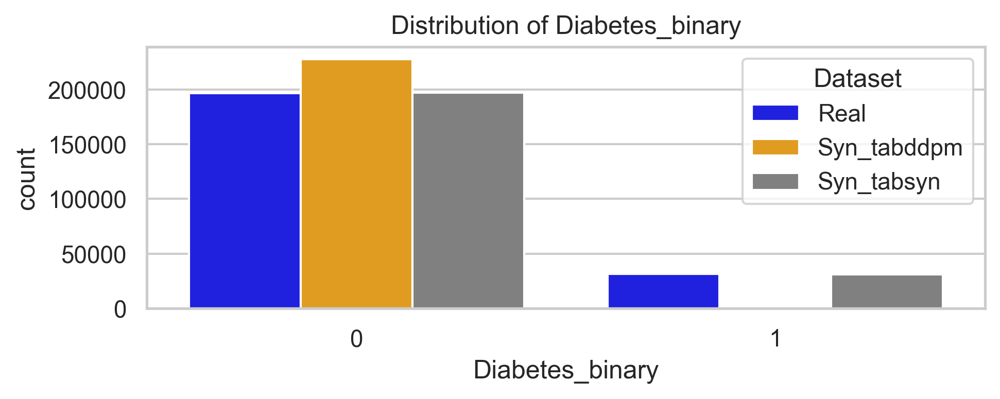

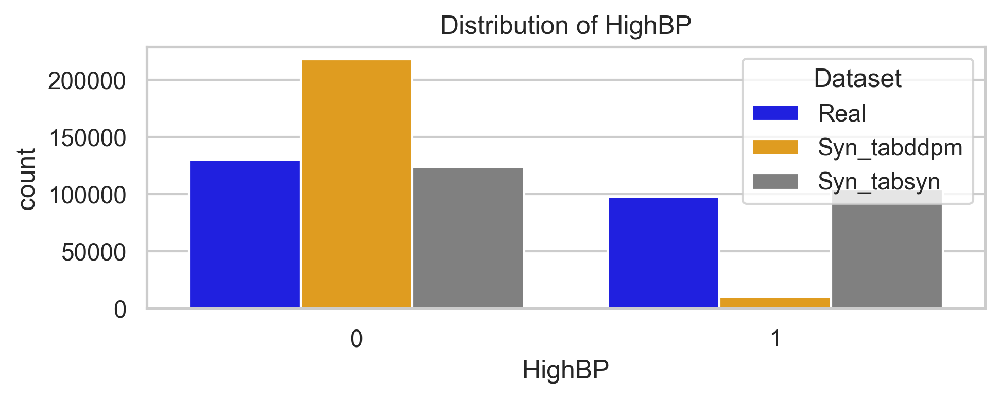

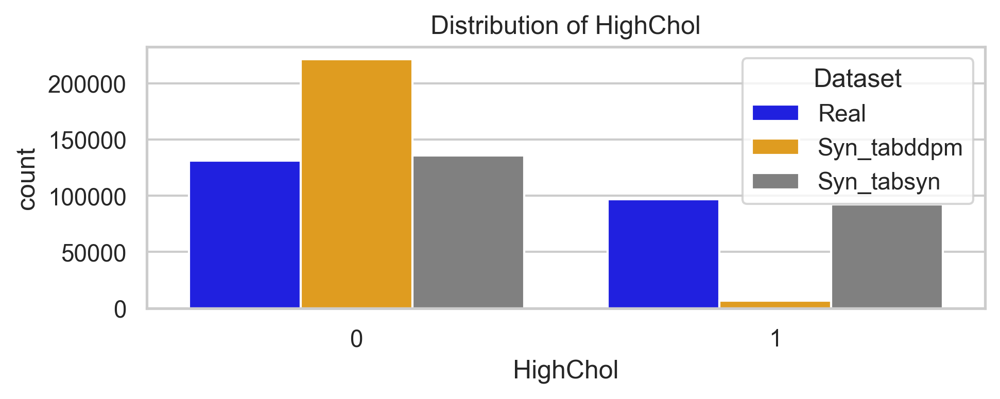

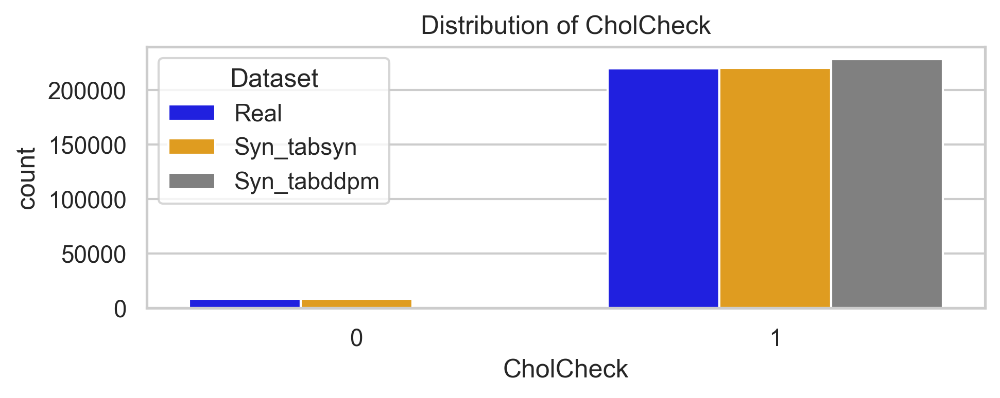

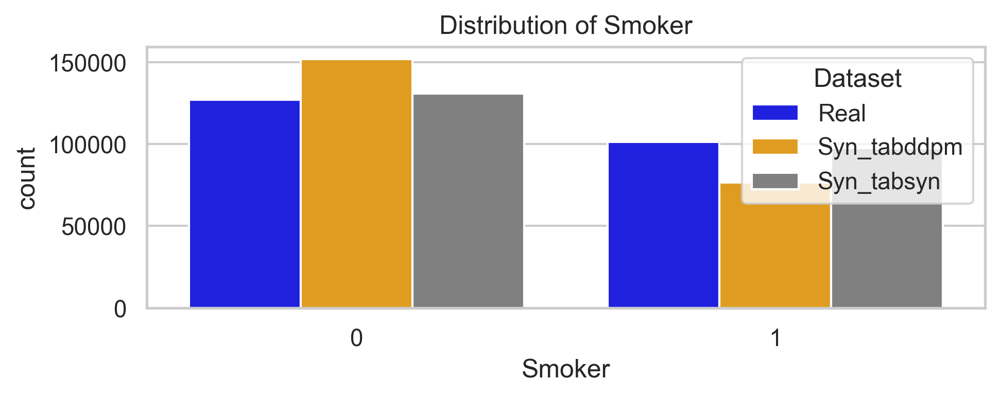

...

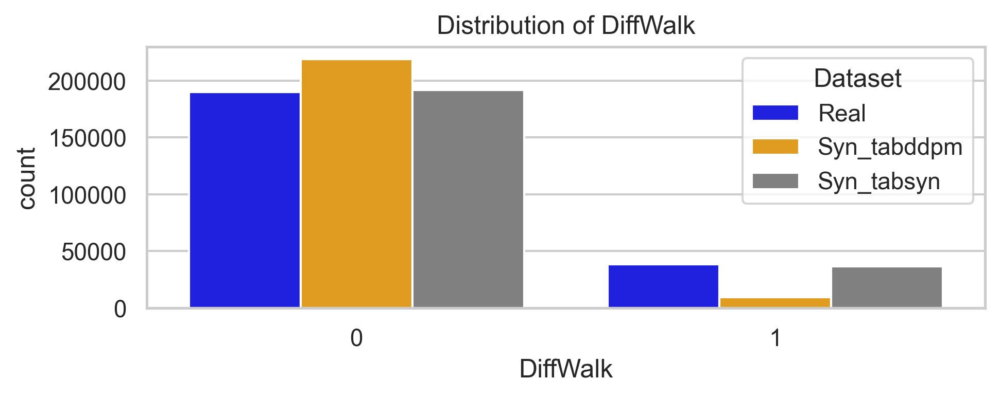

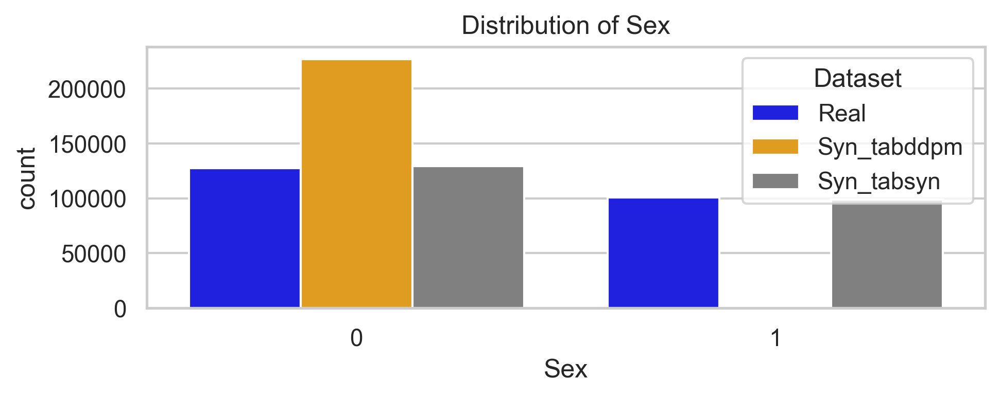

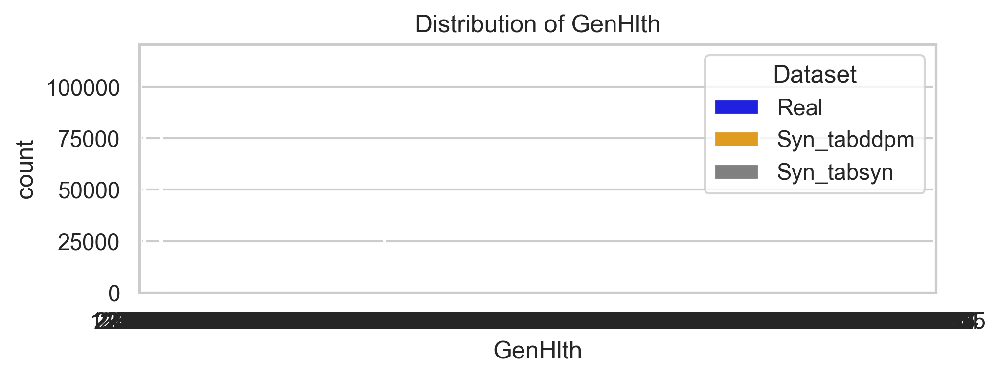

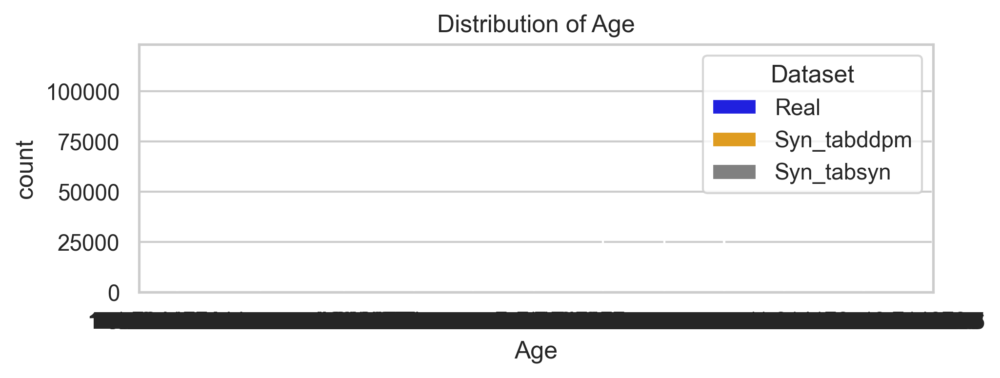

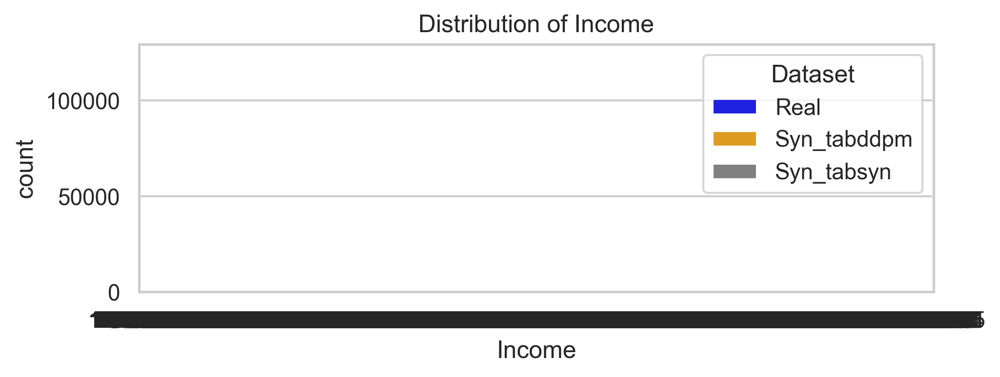

In [7]:
# Compare the "categorical variables" of the real dataset, synthetic dataset generated by Tabddpm and synthetic dataset generated by Tabsyn
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Concatenate the datasets with an additional 'dataset' column
real_diabetes['dataset'] = 'Real'
syn_diabetes_tabddpm['dataset'] = 'Syn_tabddpm'
syn_diabetes_tabsyn['dataset'] = 'Syn_tabsyn'
combined_diabetes = pd.concat([real_diabetes, syn_diabetes_tabddpm, syn_diabetes_tabsyn])

# Set the style of seaborn
sns.set(style="whitegrid")

# Create a matrix of bar graphs for each categorical variable
for column in diabetes_cat:
    plt.figure(figsize=(7, 2.2),dpi=300)
    
    # Create a countplot for each categorical variable with different colors for real and synthetic
    sns.countplot(x=column, data=combined_diabetes, hue='dataset', palette=['blue', 'orange', 'grey'])
    plt.title(f'Distribution of {column}')
    plt.legend(title='Dataset')
    if column=='Diabetes_binary':
       plt.savefig("bar_graph2.png",dpi=300)
    plt.show()


#### Numerical Variables (Distribution Charts)

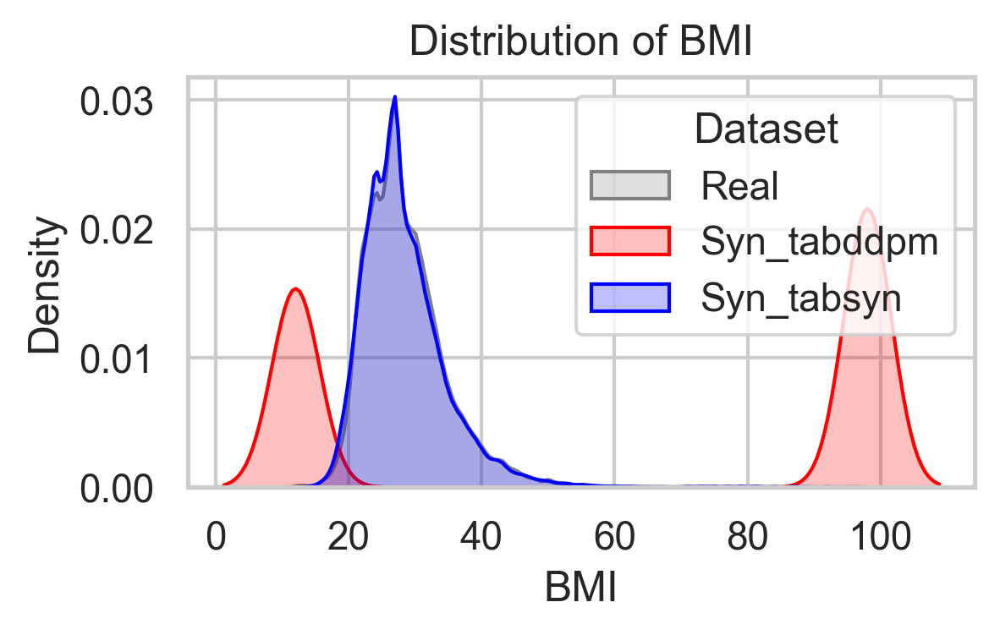

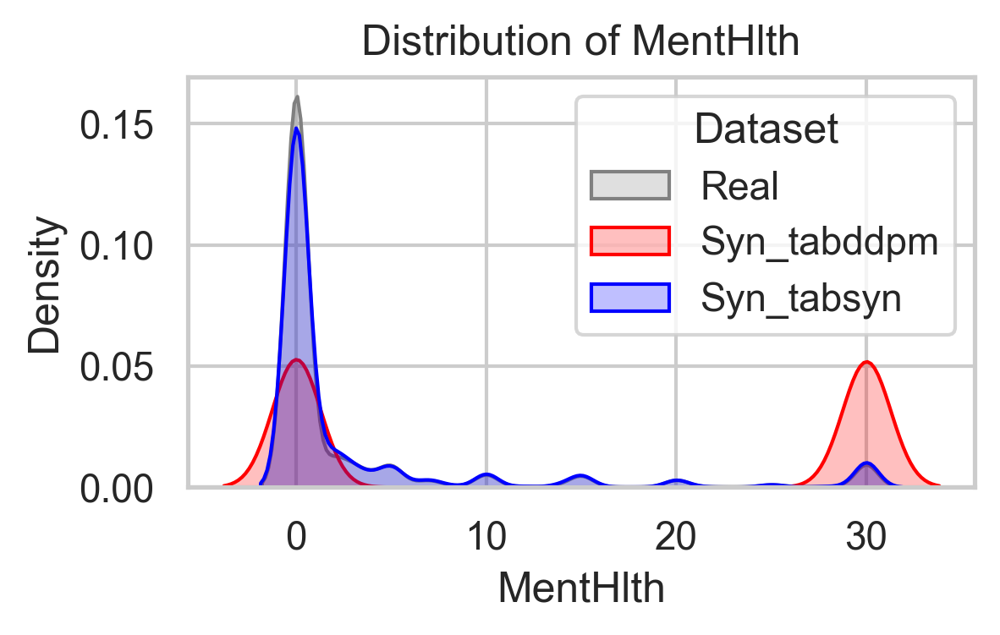

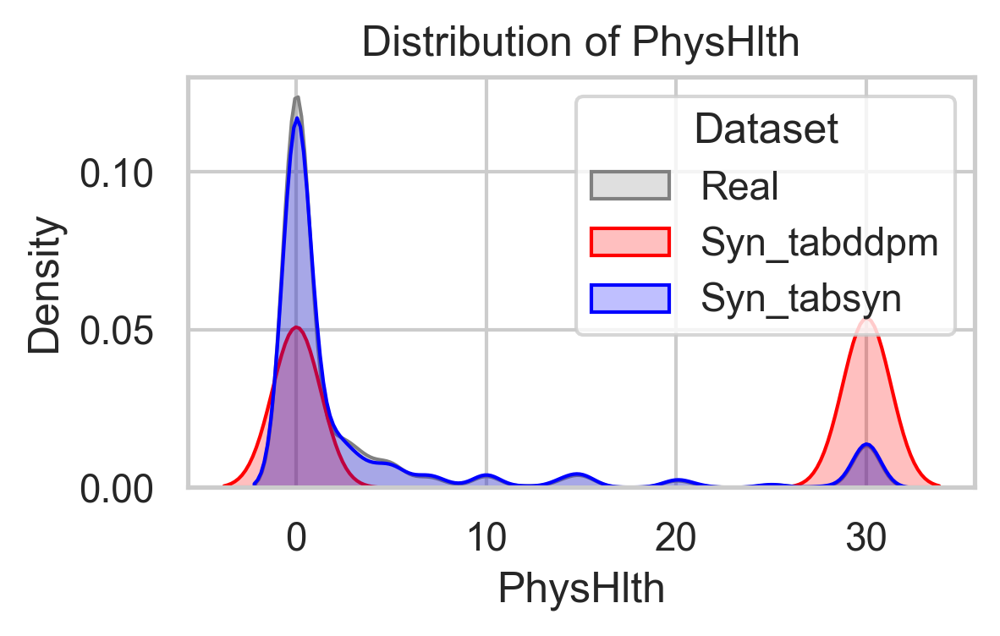

In [9]:
# Concatenate the datasets with an additional 'dataset' column
real_diabetes['dataset'] = 'Real'
syn_diabetes_tabddpm['dataset'] = 'Syn_tabddpm'
syn_diabetes_tabsyn['dataset'] = 'Syn_tabsyn'
combined_diabetes = pd.concat([real_diabetes, syn_diabetes_tabddpm, syn_diabetes_tabsyn])

# Set the style of seaborn
sns.set(style="whitegrid")

# Create a matrix of distribution charts for each numeric variable
for column in diabetes_num:
    plt.figure(figsize=(4, 2.1),dpi=300)
    
    # Create a distribution plot for each numeric variable with different colors for real and synthetic
    sns.kdeplot(data=combined_diabetes, x=column, hue='dataset', fill=True, palette=['blue', 'red', 'grey'], legend=True)#, hue_order=['Real', 'Syn_tabddpm', 'Syn_tabsyn'])
    
    plt.title(f'Distribution of {column}')
    plt.legend(title='Dataset', labels=['Real', 'Syn_tabddpm', 'Syn_tabsyn'])
    if column == 'BMI':
        plt.savefig("dist_graph2.png",dpi=300)
        
    plt.show()


#### Other Metrices to evaluate the similarity for Numerical Variables

#### **Similarity Evaluation**

#### Kolmogorov Smirnov Test

Result of real and Tabddpm dataset (BMI): KS Statistic = 0.583385892988542, p-value = 0.0

Result of real and Tabsyn dataset (BMI): KS Statistic = 0.02162391814709691, p-value = 8.432190060478963e-47



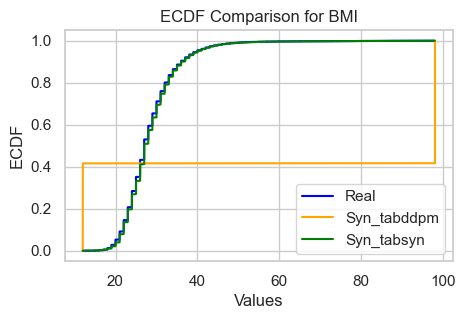

Result of real and Tabddpm dataset (MentHlth): KS Statistic = 0.44808858053891165, p-value = 0.0

Result of real and Tabsyn dataset (MentHlth): KS Statistic = 0.03639318126073088, p-value = 8.420664726587479e-132



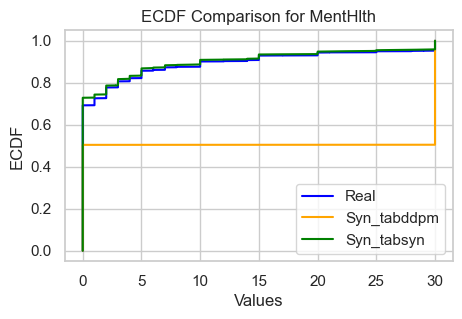

Result of real and Tabddpm dataset (PhysHlth): KS Statistic = 0.437020393146221, p-value = 0.0

Result of real and Tabsyn dataset (PhysHlth): KS Statistic = 0.030423280423280463, p-value = 3.1503284816464e-92



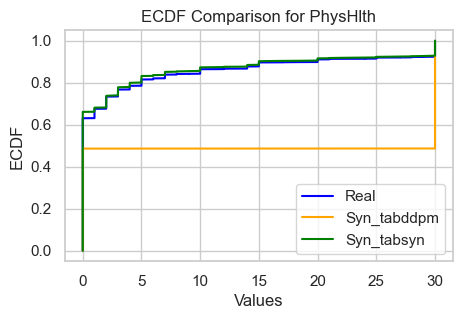

In [17]:
from scipy.stats import ks_2samp
import matplotlib.pyplot as plt
import numpy as np

# Assuming X, Y, and Z are DataFrames with 8 columns each
X = real_diabetes[diabetes_num]
Y = syn_diabetes_tabddpm[diabetes_num]
Z = syn_diabetes_tabsyn[diabetes_num]
columns = X.columns

for column in columns:
    x = X[column]
    y = Y[column]
    z = Z[column]

    # Perform KS test between real and Tabddpm dataset
    ks_statistic_1, p_value_1 = ks_2samp(x, y)

    # Perform KS test between real and Tabsyn dataset
    ks_statistic_2, p_value_2 = ks_2samp(x, z)

    print(f"Result of real and Tabddpm dataset ({column}): KS Statistic = {ks_statistic_1}, p-value = {p_value_1}")
    print()
    print(f"Result of real and Tabsyn dataset ({column}): KS Statistic = {ks_statistic_2}, p-value = {p_value_2}")
    print()

    # Visualize the ECDFs
    plt.figure(figsize=(5, 3))
    plt.plot(np.sort(x), np.arange(1, len(x) + 1) / len(x), label='Real', color='blue')
    plt.plot(np.sort(y), np.arange(1, len(y) + 1) / len(y), label='Syn_tabddpm', color='orange')
    plt.plot(np.sort(z), np.arange(1, len(z) + 1) / len(z), label='Syn_tabsyn', color='green')
    plt.xlabel('Values')
    plt.ylabel('ECDF')
    plt.title(f'ECDF Comparison for {column}')
    plt.legend()
    plt.show()

### Chi- Square for Categorical Variables

In [18]:
### Chi square for real dataset and dataset generated by Tabddpm
from scipy.stats import chi2_contingency
#list of categorical columns i.e. diabetes_cat

def perform_chi_squared_test(dataframe1, dataframe2, column):
    # Create a contingency table
    contingency_table = pd.crosstab(dataframe1[column], dataframe2[column])

    # Perform the chi-squared test
    chi2, p, _, _ = chi2_contingency(contingency_table)

    print(f"Chi-Squared Test for '{column}':")
    print(f"Chi-Squared Statistic: {chi2}")
    print(f"P-value: {p}")
    print("")

# Perform the chi-squared test for each common categorical column for datasets real_adult and syn_adult_tabddpm
for column in diabetes_cat:
    perform_chi_squared_test(real_diabetes, syn_diabetes_tabddpm, column)


Chi-Squared Test for 'Diabetes_binary':
Chi-Squared Statistic: 0.6424413568546048
P-value: 0.4228281267362485

Chi-Squared Test for 'HighBP':
Chi-Squared Statistic: 1.674108897383228
P-value: 0.19570908419049718

Chi-Squared Test for 'HighChol':
Chi-Squared Statistic: 0.7093178764089878
P-value: 0.399670353429314

Chi-Squared Test for 'CholCheck':
Chi-Squared Statistic: 0.0
P-value: 1.0

Chi-Squared Test for 'Smoker':
Chi-Squared Statistic: 0.15189724360734463
P-value: 0.6967288378324292

Chi-Squared Test for 'Stroke':
Chi-Squared Statistic: 0.0
P-value: 1.0

Chi-Squared Test for 'HeartDiseaseorAttack':
Chi-Squared Statistic: 3.1247370237441996
P-value: 0.07711231271101175

Chi-Squared Test for 'PhysActivity':
Chi-Squared Statistic: 0.1864190528688838
P-value: 0.6659138717494291

Chi-Squared Test for 'Fruits':
Chi-Squared Statistic: 0.07064820530189789
P-value: 0.7903953218423536

Chi-Squared Test for 'Veggies':
Chi-Squared Statistic: 1.0777069659171064
P-value: 0.29921109024469084

Ch

In [19]:
### Chi square for real dataset and dataset generated by Tabsyn
from scipy.stats import chi2_contingency
#list of categorical columns i.e. diabetes_cat

def perform_chi_squared_test(dataframe1, dataframe2, column):
    # Create a contingency table
    contingency_table = pd.crosstab(dataframe1[column], dataframe2[column])

    # Perform the chi-squared test
    chi2, p, _, _ = chi2_contingency(contingency_table)

    print(f"Chi-Squared Test for '{column}':")
    print(f"Chi-Squared Statistic: {chi2}")
    print(f"P-value: {p}")
    print("")

# Perform the chi-squared test for each common categorical column for datasets real_adult and syn_adult_tabddpm
for column in diabetes_cat:
    perform_chi_squared_test(real_diabetes, syn_diabetes_tabsyn, column)


Chi-Squared Test for 'Diabetes_binary':
Chi-Squared Statistic: 0.579857849273687
P-value: 0.44636804486977444

Chi-Squared Test for 'HighBP':
Chi-Squared Statistic: 0.017247899281251873
P-value: 0.8955132657645135

Chi-Squared Test for 'HighChol':
Chi-Squared Statistic: 3.396601827494332
P-value: 0.0653308790452201

Chi-Squared Test for 'CholCheck':
Chi-Squared Statistic: 0.004295514295612378
P-value: 0.9477439215342005

Chi-Squared Test for 'Smoker':
Chi-Squared Statistic: 0.38294875500484027
P-value: 0.5360293222771009

Chi-Squared Test for 'Stroke':
Chi-Squared Statistic: 0.7313740525856681
P-value: 0.39243816685167643

Chi-Squared Test for 'HeartDiseaseorAttack':
Chi-Squared Statistic: 2.686518079957887
P-value: 0.10120073932782404

Chi-Squared Test for 'PhysActivity':
Chi-Squared Statistic: 0.8535099317690991
P-value: 0.3555612877371118

Chi-Squared Test for 'Fruits':
Chi-Squared Statistic: 0.7202463915556309
P-value: 0.3960631001538708

Chi-Squared Test for 'Veggies':
Chi-Squared

### Wasserstein Distance

Wasserstein Distance between real_BMI and syn_BMI: 43.09428198894495


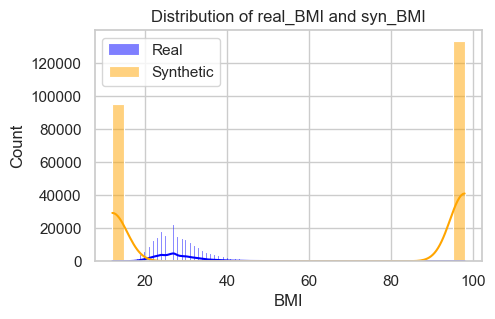

Wasserstein Distance between real_MentHlth and syn_MentHlth: 11.685168784470374


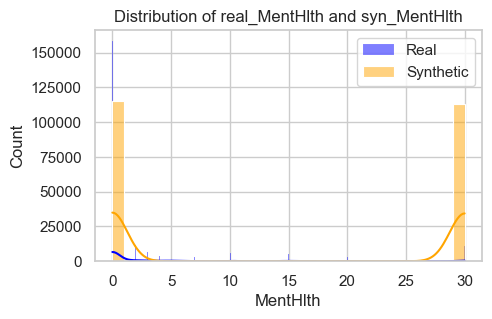

Wasserstein Distance between real_PhysHlth and syn_PhysHlth: 11.164200742843128


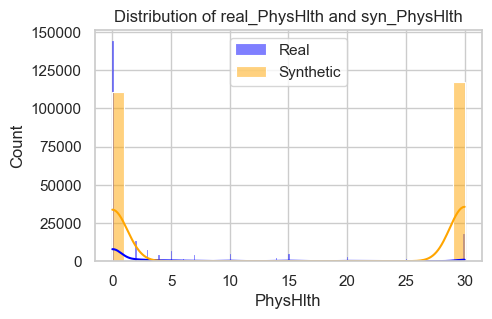

In [20]:
## Wasserstein distance between real dataset and synthetic dataset generated by Tabddpm
from scipy.stats import wasserstein_distance
import matplotlib.pyplot as plt

def calculate_and_visualize_wasserstein(dataset1, dataset2):
    columns = diabetes_num

    for var in columns:
            distance = wasserstein_distance(dataset1[var], dataset2[var])
            print(f"Wasserstein Distance between real_{var} and syn_{var}: {distance}")

            # Visualize the distributions
            plt.figure(figsize=(5, 3))
            sns.histplot(dataset1[var], label='Real', kde=True, color='blue')
            sns.histplot(dataset2[var], label='Synthetic', kde=True, color='orange')
            plt.title(f'Distribution of real_{var} and syn_{var}')
            plt.legend()
            plt.show()

calculate_and_visualize_wasserstein(real_diabetes, syn_diabetes_tabddpm)


Wasserstein Distance between real_BMI and syn_BMI: 0.27190298921213074


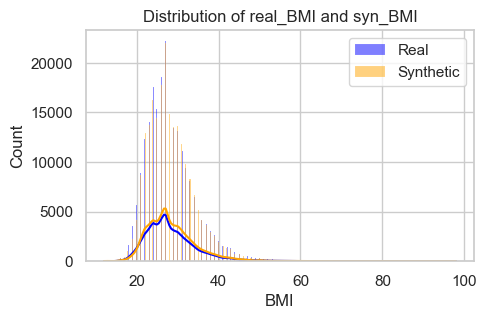

Wasserstein Distance between real_MentHlth and syn_MentHlth: 0.26281517077062516


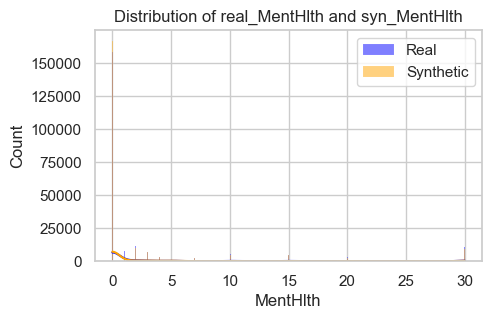

Wasserstein Distance between real_PhysHlth and syn_PhysHlth: 0.2622985908067207


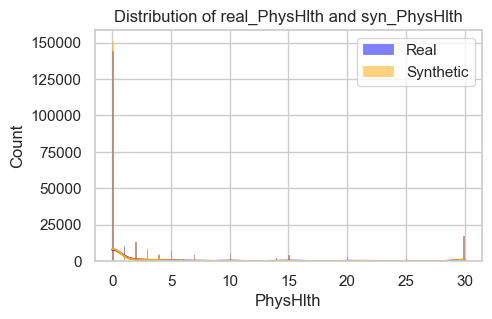

In [22]:
## ## Wasserstein distance between real dataset and synthetic dataset generated by Tabsyn

calculate_and_visualize_wasserstein(real_diabetes, syn_diabetes_tabsyn)

#### Density estimation of single column and pair-wise correlation

In [23]:
!python eval/eval_density.py --dataname diabetes --model tabddpm --path C:\Users\neetu\Documents\Untitled_Folder\tabsyn\synthetic\diabetes\tabddpm.csv

C:\Users\neetu\Documents\Untitled_Folder\tabsyn\synthetic\diabetes\tabddpm.csv
Generating report ...

(1/2) Evaluating Column Shapes: : 100%|##########| 22/22 [00:00<00:00, 26.39it/s]

(2/2) Evaluating Column Pair Trends: : 100%|##########| 231/231 [01:07<00:00,  3.44it/s]

Overall Quality Score: 62.25%

Properties:
- Column Shapes: 72.04%
- Column Pair Trends: 52.46%
Generating report ...

(1/3) Evaluating Coverage: : 100%|##########| 22/22 [00:00<00:00, 265.62it/s]

(2/3) Evaluating Boundary: : 100%|##########| 22/22 [00:00<00:00, 187.74it/s]

(3/3) Evaluating Synthesis: : 100%|##########| 1/1 [00:00<00:00, 23.83it/s]

Diagnostic Results:

SUCCESS:


Traceback (most recent call last):
  File "C:\Users\neetu\Documents\Untitled_Folder\tabsyn\eval\eval_density.py", line 99, in <module>
    diag_report.generate(new_real_data, new_syn_data, metadata)
  File "C:\Users\neetu\anaconda3\envs\tab\lib\site-packages\sdmetrics\reports\base_report.py", line 155, in generate
    self._handle_results(verbose)
  File "C:\Users\neetu\anaconda3\envs\tab\lib\site-packages\sdmetrics\reports\single_table\diagnostic_report.py", line 29, in _handle_results
    self._results_handler.print_results(self._properties, verbose)
  File "C:\Users\neetu\anaconda3\envs\tab\lib\site-packages\sdmetrics\reports\_results_handler.py", line 149, in print_results
    self._print_results_for_level('SUCCESS')
  File "C:\Users\neetu\anaconda3\envs\tab\lib\site-packages\sdmetrics\reports\_results_handler.py", line 117, in _print_results_for_level
    sys.stdout.write(f'{level_marks[level]} {result}\n')
  File "C:\Users\neetu\anaconda3\envs\tab\lib\encodings\cp1252.py", line 1

In [24]:
!python eval/eval_density.py --dataname diabetes --model tabsyn --path C:\Users\neetu\Documents\Untitled_Folder\tabsyn\synthetic\diabetes\tabsyn.csv

C:\Users\neetu\Documents\Untitled_Folder\tabsyn\synthetic\diabetes\tabsyn.csv
Generating report ...

(1/2) Evaluating Column Shapes: : 100%|##########| 22/22 [00:02<00:00,  9.83it/s]

(2/2) Evaluating Column Pair Trends: : 100%|##########| 231/231 [01:07<00:00,  3.42it/s]

Overall Quality Score: 97.94%

Properties:
- Column Shapes: 98.51%
- Column Pair Trends: 97.36%
Generating report ...

(1/3) Evaluating Coverage: : 100%|##########| 22/22 [00:00<00:00, 274.21it/s]

(2/3) Evaluating Boundary: : 100%|##########| 22/22 [00:00<00:00, 241.69it/s]

(3/3) Evaluating Synthesis: : 100%|##########| 1/1 [00:00<00:00, 25.73it/s]

Diagnostic Results:

SUCCESS:


Traceback (most recent call last):
  File "C:\Users\neetu\Documents\Untitled_Folder\tabsyn\eval\eval_density.py", line 99, in <module>
    diag_report.generate(new_real_data, new_syn_data, metadata)
  File "C:\Users\neetu\anaconda3\envs\tab\lib\site-packages\sdmetrics\reports\base_report.py", line 155, in generate
    self._handle_results(verbose)
  File "C:\Users\neetu\anaconda3\envs\tab\lib\site-packages\sdmetrics\reports\single_table\diagnostic_report.py", line 29, in _handle_results
    self._results_handler.print_results(self._properties, verbose)
  File "C:\Users\neetu\anaconda3\envs\tab\lib\site-packages\sdmetrics\reports\_results_handler.py", line 149, in print_results
    self._print_results_for_level('SUCCESS')
  File "C:\Users\neetu\anaconda3\envs\tab\lib\site-packages\sdmetrics\reports\_results_handler.py", line 117, in _print_results_for_level
    sys.stdout.write(f'{level_marks[level]} {result}\n')
  File "C:\Users\neetu\anaconda3\envs\tab\lib\encodings\cp1252.py", line 1

#### Alpha Precision and Beta Recall
- 1. Alpha -preicison: the fidelity of synthetic data
- 2. Beta -recall: the diversity of synthetic data

In [6]:
!python eval/eval_quality.py --dataname diabetes --model tabddpm --path C:\Users\neetu\Documents\Untitled_Folder\tabsyn\synthetic\diabetes\tabddpm.csv

[KeOps] Warning : 
    The default C++ compiler could not be found on your system.
    You need to either define the CXX environment variable or a symlink to the g++ command.
    For example if g++-8 is the command you can do
      import os
      os.environ['CXX'] = 'g++-8'
    
[KeOps] Warning : Cuda libraries were not detected on the system or could not be loaded ; using cpu only mode
C:\Users\neetu\Documents\Untitled_Folder\tabsyn\synthetic\diabetes\tabddpm.csv
=========== All Features ===========
Data shape:  (228312, 37)
alpha precision: 0.654518, beta recall: 0.000322


**Interpretation** : 
- **α-Precision**: It evaluates the fidelity of synthetic data – whether each synthetic example comes from the real-data distribution.
- **β-Recall**: It evaluates the coverage of the synthetic data, e.g., whether the synthetic data can cover the entire distribution of the real data (In other words, whether a real data sample is close to the synthetic data).

In [5]:
!python eval/eval_quality.py --dataname diabetes --model tabsyn --path C:\Users\neetu\Documents\Untitled_Folder\tabsyn\synthetic\diabetes\tabsyn.csv

[KeOps] Warning : 
    The default C++ compiler could not be found on your system.
    You need to either define the CXX environment variable or a symlink to the g++ command.
    For example if g++-8 is the command you can do
      import os
      os.environ['CXX'] = 'g++-8'
    
[KeOps] Warning : Cuda libraries were not detected on the system or could not be loaded ; using cpu only mode
C:\Users\neetu\Documents\Untitled_Folder\tabsyn\synthetic\diabetes\tabsyn.csv
=========== All Features ===========
Data shape:  (228312, 37)
alpha precision: 0.977712, beta recall: 0.565779


**Result** : 
| TabDDPM                        | TabSyn                        |
| ------------------------------- | ----------------------------- |
|  alpha precision: 0.654518 | alpha precision: 0.975135 |
|    - beta recall: 0.000322                  | beta recall: 0.303774                   |

- This implies the TabSyn is performing better in regards of overall Fidelity and Diversity of the synthetic dataset.
- These Results implies that TabSyn is performing significantly better than TabDDPM.


### Machine Learning Efficiency

In [27]:
!python eval/eval_mle.py --dataname diabetes --model tabddpm --path C:\Users\neetu\Documents\Untitled_Folder\tabsyn\synthetic\diabetes\tabddpm.csv

Saving scores to  eval/mle/diabetes/tabddpm.json



100%|##########| 48/48 [00:09<00:00,  4.81it/s]

100%|##########| 4/4 [00:47<00:00, 12.00s/it]

  6%|5         | 2/36 [00:01<00:29,  1.13it/s]C:\Users\neetu\anaconda3\envs\tab\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(

 39%|###8      | 14/36 [00:10<00:16,  1.36it/s]C:\Users\neetu\anaconda3\envs\tab\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scik

**Results**:  
- *Macro F1 Score* : This is the average F1 score across all classes. It indicates the model's ability to correctly classify instances across all classes, regardless of class imbalance.
- *ROC AUC Score* : ROC AUC (Receiver Operating Characteristic Area Under Curve) measures the model's ability to distinguish between classes. A higher ROC AUC score indicates better performance.
- *Weighted F1 score*: Weighted F1 score takes class imbalance into account. It is the weighted average of the F1 score for each class, weighted by the number of true instances for each class.
- *Accuracy* : Accuracy is the proportion of correctly classified instances out of the total instances. It measures overall correctness of the model's predictions.

In [28]:
!python eval/eval_mle.py --dataname diabetes --model tabsyn --path C:\Users\neetu\Documents\Untitled_Folder\tabsyn\synthetic\diabetes\tabsyn.csv

Saving scores to  eval/mle/diabetes/tabsyn.json



100%|##########| 48/48 [00:31<00:00,  1.51it/s]

100%|##########| 4/4 [00:52<00:00, 13.02s/it]

  6%|5         | 2/36 [00:01<00:29,  1.15it/s]C:\Users\neetu\anaconda3\envs\tab\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(

 39%|###8      | 14/36 [00:11<00:17,  1.25it/s]C:\Users\neetu\anaconda3\envs\tab\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scik

|TabDDPM                                 | TabSyn                                        |
|----------------------------------------|-----------------------------------------------|
|- **MLP Classifier**                        |- **MLP Classifier**                             |
|1. binary_f 1 0.049639711769415534          | 0.1944252476387929                           |
|2. roc_auc  0.7415622175418086            | 0.8192705719769515                          |
|3. weighted_f1  0.17230383673287242       | 0.29683980504738644                          |
|4. accuracy  0.8596263008514664           | 0.8621491643014821                          |
|- **Decision Tree Classifier**              | - **Decision Tree Classifier**                   |
|1. binary_f1  0.17450743868114194          | 0.2843816254416961                           |
|2. roc_auc  0.5927318924566733            | 0.5987449739033438                          |
|3. weighted_f1  0.2777028277307142        | 0.36848674829007994                          |
|4. accuracy  0.8381425417849259          | 0.8004178492589089                          |
|- **Random Forest Classifier**              | - **Random Forest Classifier**                   |
|1. binary_f1  0.05943691345151199           | 0.21468441391155002                           |
|2. roc_auc  0.6734974319581011            | 0.7860638559442928                           |
|3. weighted_f1  0.18056620277742225        | 0.3136947206114747                           |
|4. accuracy  0.8577735730053611           | 0.8558025859350362                           |
|- **XGB Classifier**                        | - **XGB Classifier**                              |
|1. binary_f1  0.027472527472527472            | 0.2639554958756954                          |
|2. roc_auc  0.7393518174875819            | 0.771975340715294                          |
|3. weighted_f1  0.15333240898775916        | 0.35536802240886245                          |
|4. accuracy  0.8604541154210028           | 0.8487464522232734                          |
|- **AdaBoostClassifier**                        | - **AdaBoostClassifier**                              |
|1. binary_f1  0.11190534877988662            | 0.2361574382921948                           |
|2. roc_auc  0.7340250474291359            | 0.827325123021939                           |
|3. weighted_f1  0.22563959411478496       | 0.33287122528656543                           |
|4. accuracy  0.8579706717123936           | 0.8645931882686849                              |
| **Logistic Regression**                   | -**Logistic Regression**                            |
|1. binary_f 10.0247252747252747246            |0.206817661862274071                           |
|2. roc_au c0.7556898339406788            |0.8258443140062666                           |
|3. weighted_f 10.150940692628967534        |0.3075780263128912                           |
|4. accurac  0.86005991800693793           |0.86333175654367717                           |
- As per the results by both generated datasets,TabSynM is working better thanTabDDPMn.

### Privacy protection: Distance to Closest Record (DCR)

In [7]:
!python eval/eval_dcr.py --dataname diabetes --model tabddpm --path C:\Users\neetu\Documents\Untitled_Folder\tabsyn\synthetic\diabetes\tabddpm.csv

DCR Score, a value closer to 0.5 is better
diabetes-tabddpm, DCR Score = 0.8888538491187498


In [2]:
!python eval/eval_dcr.py --dataname diabetes --model tabsyn --path C:\Users\neetu\Documents\Untitled_Folder\tabsyn\synthetic\diabetes\tabsyn.csv

DCR Score, a value closer to 0.5 is better
diabetes-tabsyn, DCR Score = 0.8746320824135394
